In [14]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from sklearn.metrics import mean_absolute_error, mean_squared_error
from keras.models import Sequential
from keras.layers import LSTM, Dense, Reshape
from keras.callbacks import ReduceLROnPlateau
from sklearn.preprocessing import MinMaxScaler
import tensorflow as tf

In [15]:
df = pd.read_csv("datasets/processed_data_with_stages.csv")
df = df.rename(columns={"Unnamed: 0":"Timestamp"})

In [16]:
STAGES_LENGTH = 150
N_STAGES = len(df)/STAGES_LENGTH

In [27]:
train_df = df[0:int(STAGES_LENGTH*16)]
val_df = df[int(STAGES_LENGTH*16):int(STAGES_LENGTH*20)]
test_df = df[int(STAGES_LENGTH*20):]

In [28]:
test_df = df[0:int(STAGES_LENGTH*2)]
val_df = df[int(STAGES_LENGTH*2):int(STAGES_LENGTH*6)]
train_df = df[int(STAGES_LENGTH*6):]

In [8]:
print(len(train_df))
print(len(val_df))
print(len(test_df))

2400
600
300


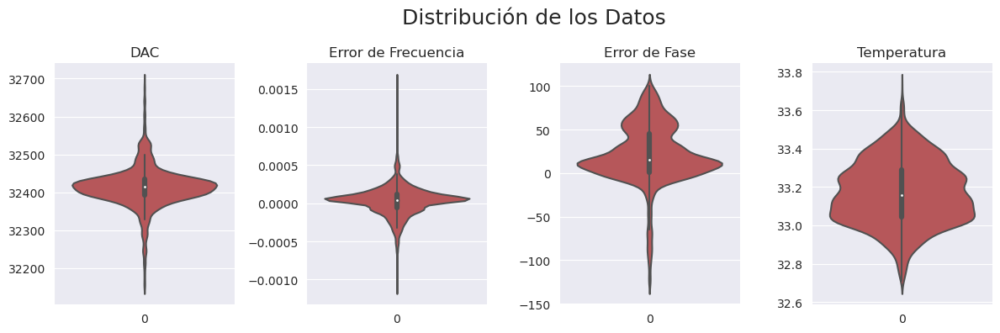

In [18]:
plt.figure(figsize=(12,4))
plt.suptitle('          Distribución de los Datos',fontsize=18)
plt.subplot(1, 4, 1)

plt.title('DAC')
sns.violinplot(data=df['DAC'],color="#c6474b")
plt.xlabel("")
sns.set_style("darkgrid")
sns.despine()

plt.subplot(1, 4, 2)

plt.title('Error de Frecuencia')
sns.violinplot(data=df['Frequency Error'],color="#c6474b")
plt.xlabel("")


sns.set_style("darkgrid")

sns.despine()

plt.subplot(1, 4, 3)

plt.title('Error de Fase')
sns.violinplot(data=df['Phase Error'],color="#c6474b")
plt.xlabel("")

sns.set_style("darkgrid")

sns.despine()

plt.subplot(1, 4, 4)

plt.title('Temperatura')
sns.violinplot(data=df['Temperature'],color="#c6474b")
plt.xlabel("")
sns.set_style("darkgrid")

sns.despine()

plt.tight_layout()

#plt.savefig("fotos/distribucion_normal.png")

In [20]:
train_df.mean()

Timestamp           1199.500000
DAC                32413.848758
Frequency Error        0.000032
Phase Error           23.469861
Temperature           33.169504
dtype: float64

In [35]:
def normalize_datasets(train_df, val_df, test_df):
    train_mean = train_df.drop("Timestamp",axis=1).mean()
    train_std = train_df.drop("Timestamp",axis=1).std()

    train_df = (train_df.drop("Timestamp",axis=1) - train_mean) / train_std
    test_df = (test_df.drop("Timestamp",axis=1) - train_mean) / train_std    
    val_df = (val_df.drop("Timestamp",axis=1) - train_mean) / train_std
    return train_df, val_df, test_df, train_mean, train_std

In [29]:
train_df, val_df, test_df, train_mean, train_std = normalize_datasets(train_df, val_df, test_df)

In [111]:
#train_df["Timestamp"] = df["Timestamp"][0:int(STAGES_LENGTH*16)]
#val_df["Timestamp"] = df["Timestamp"][int(STAGES_LENGTH*16):int(STAGES_LENGTH*20)]
#test_df["Timestamp"] = df["Timestamp"][int(STAGES_LENGTH*20):]

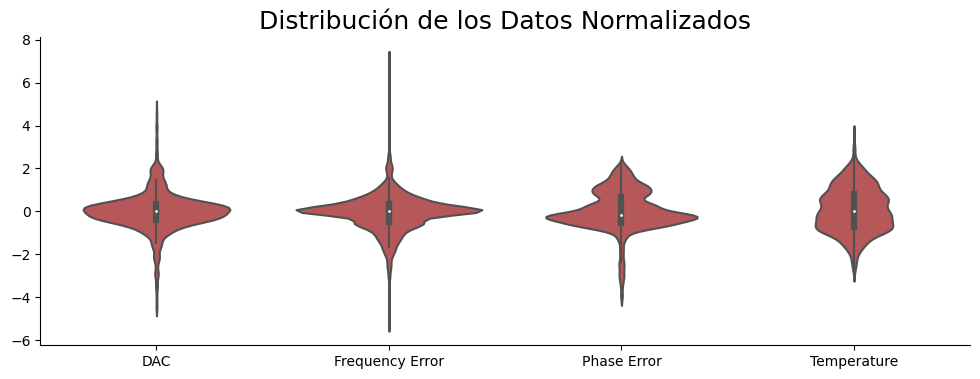

In [7]:
df_std = (df.drop("Timestamp",axis=1) - train_mean) / train_std
df_std = df_std.melt(var_name='Column', value_name='Normalized')
plt.figure(figsize=(12,4))
plt.title("Distribución de los Datos Normalizados",fontsize=18)
sns.violinplot(x='Column', y='Normalized', data=df_std, color="#c6474b")
plt.xlabel("")
plt.ylabel("")
sns.set_style("darkgrid")
sns.despine()
#plt.savefig("fotos/normalizada_distribucion_normal.png")


In [22]:
def generate_window_per_stage(df, feature_to_predict, input_size=50, output_size=100):
    input_windows = []
    output_windows = []

    # Obtener las ventanas deslizantes
    for i in range(0, len(df) - input_size - output_size + 1, input_size + output_size):
        input_window = df[i:i+input_size]
        output_window = df[i+input_size:i+input_size+output_size][feature_to_predict]
        input_windows.append(input_window)
        output_windows.append(output_window)

    # Convertir las listas a arreglos NumPy
    input_windows = np.array(input_windows)
    output_windows = np.array(output_windows)
    output_windows = output_windows.reshape(output_windows.shape[0],output_windows.shape[1],1)

    # Verificar las dimensiones de los arreglos
    print("Dimensiones de las ventanas de entrada:", input_windows.shape)
    print("Dimensiones de las ventanas de salida:", output_windows.shape)
    return input_windows, output_windows

In [31]:
X_train, y_train = generate_window_per_stage(train_df, "DAC", 100,50)
X_val, y_val = generate_window_per_stage(val_df, "DAC",100,50)
X_test, y_test = generate_window_per_stage(test_df, "DAC",100,50)

Dimensiones de las ventanas de entrada: (16, 100, 4)
Dimensiones de las ventanas de salida: (16, 50, 1)
Dimensiones de las ventanas de entrada: (4, 100, 4)
Dimensiones de las ventanas de salida: (4, 50, 1)
Dimensiones de las ventanas de entrada: (2, 100, 4)
Dimensiones de las ventanas de salida: (2, 50, 1)


In [32]:
def train_model(X_train, y_train, X_val, y_val, steps, deep_layers, lstm_units, lr, bs, epochs):
    model = Sequential()
    
    for i in range(deep_layers):
        model.add(LSTM(lstm_units, return_sequences=True))
    
    model.add(LSTM(lstm_units, return_sequences=False))
    model.add(Dense(steps, activation="linear", kernel_initializer=tf.initializers.zeros()))
    

    early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss',
                                                    patience=20,
                                                    mode='min')
    
    rlrop = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5)
    
    model.compile(loss=tf.keras.losses.MeanSquaredError(),
                optimizer=tf.keras.optimizers.Adam(learning_rate=lr),
                metrics=[tf.keras.metrics.MeanAbsoluteError()])
    
    history = model.fit(X_train,y_train, epochs=epochs, batch_size=bs,
                      validation_data=(X_val,y_val),
                      callbacks=[early_stopping, rlrop],verbose=0)
    return history, model

In [19]:
def get_metrics(test,pred, print_results=True):
    mae = mean_absolute_error(test, pred)
    mse = mean_squared_error(test, pred)
    if print_results:
        print('MAE: ', mae)
        print('MSE: ', mse)
        print('RMSE: ', np.sqrt(mse))
    return mae, np.sqrt(mse)

In [42]:
history, model = train_model(X_train, y_train, X_val, y_val, deep_layers=1,
                             steps=50, lstm_units=120, lr=0.008, bs=1, epochs=300)
results = model.predict(X_test, verbose=0).reshape(y_test.shape[0],y_test.shape[1],1)
mae, rmse = get_metrics(y_test.flatten(), results.flatten())

2023-05-29 22:02:24.915958: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-05-29 22:02:24.918471: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-05-29 22:02:24.920699: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.273917791690421
MSE:  0.10503905145776495
RMSE:  0.32409728702623375


In [14]:
def tuning(results_df, X_train, y_train, X_val, y_val, steps, layers, lstm_units, lr, bs, epochs):
    for deep in layers:
        for units in lstm_units:
            for learning in lr:
                for batch in bs:
                    history, model = train_model(X_train, y_train, X_val, y_val, 
                                                 deep_layers=deep, steps=steps, lstm_units=units,
                                                 lr=learning, bs=batch, epochs=epochs)
                    results = model.predict(X_test, verbose=0).reshape(y_test.shape[0],y_test.shape[1],1)
                    mae, rmse = get_metrics(y_test.flatten(), results.flatten(), False)
                    aux = pd.Series([mae,rmse,deep,steps,units,learning,batch,epochs],index=results_df.columns)
                    results_df = results_df.append(aux,ignore_index=True)
                    #out = "\n".join([
                    #    f"Deep={deep}, Steps={steps}, LSTM_units={units}, Learning_Rate={learning}, Batch_Size={batch}, Max_Epochs={epochs}",
                    #    f"MAE:{mae}",
                    #    f"RMSE:{rmse}",
                    #    "----------------------------------------"
                    #])
                    #print(out)
                    #reset_weights(model)
    
    return results_df

In [2]:
#results_df = pd.DataFrame(columns=["mae","rmse","deep_layers","steps_predicted","lstm_units","learning_rate","batch_size","max_epochs"])
results_df = pd.read_csv("datasets/prediction_results.csv")

In [22]:
results_df.to_csv("datasets/prediction_results.csv",index=False)

In [21]:
len(results_df)

1412

In [23]:
results_df.sort_values(by="mae",ascending=True).head(20)

,mae,rmse,deep_layers,steps_predicted,lstm_units,learning_rate,batch_size,max_epochs
1376,0.201229,0.240943,1.0,50.0,120.0,0.0080,1.0,300.0
39,0.204994,0.269339,1.0,50.0,60.0,0.0100,1.0,200.0
1196,0.205801,0.248949,1.0,50.0,50.0,0.0600,1.0,300.0
1290,0.206696,0.246657,1.0,50.0,80.0,0.0400,3.0,300.0
1308,0.211499,0.265740,1.0,50.0,80.0,0.0060,1.0,300.0
1015,0.212184,0.260843,0.0,50.0,70.0,0.0020,4.0,300.0
976,0.214078,0.268289,0.0,50.0,60.0,0.0800,1.0,300.0
1068,0.214837,0.257851,0.0,50.0,100.0,0.0600,1.0,300.0
1377,0.215238,0.257223,1.0,50.0,120.0,0.0080,2.0,300.0
1406,0.217181,0.260736,1.0,50.0,150.0,0.0060,3.0,300.0


In [71]:
#results_df = tuning(results_df, X_train, y_train, X_val, y_val, 50, [0,1], [40,60,80,100,150],
#        [0.05, 0.001], [1,2,4], 200)

2023-05-28 20:09:39.610616: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-05-28 20:09:39.612727: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-05-28 20:09:39.614173: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

In [20]:
results_df = tuning(results_df, X_train, y_train, X_val, y_val, 50, [0,1], [40,50,60,70,80,100,120,150],
        [0.02,0.04,0.06,0.08,0.002,0.004,0.006,0.008], [1,2,3,4], 300)


2023-05-29 18:44:08.000028: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-05-29 18:44:08.002882: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-05-29 18:44:08.005194: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

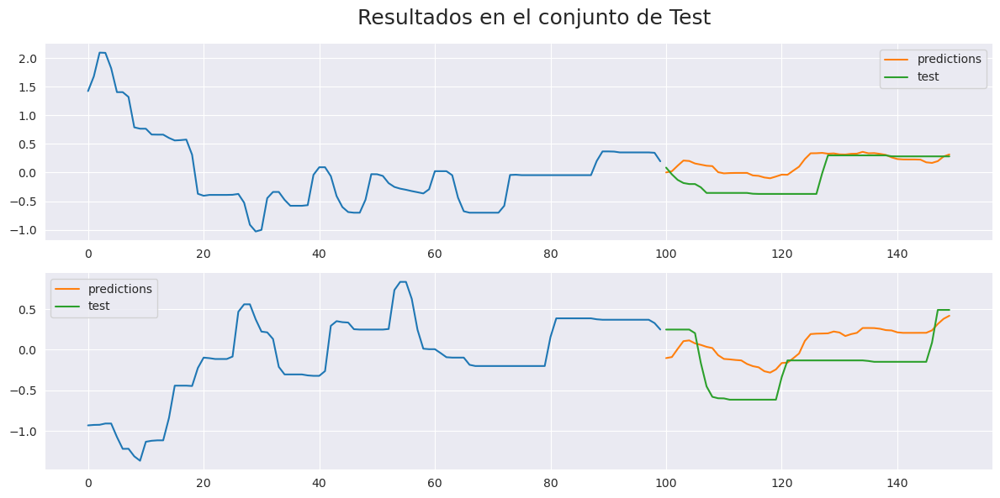

In [44]:
plt.figure(figsize=(12,6))
plt.suptitle('          Resultados en el conjunto de Test',fontsize=18)
plt.subplot(2, 1, 1)

res = results[1].reshape(results.shape[1])
sns.lineplot(x=range(0,100),y=pd.Series(value[0] for value in X_test[1]))
sns.lineplot(x=range(100,150), y=pd.Series(res), label="predictions")
sns.lineplot(x=range(100,150),y=pd.Series(y_test[1].reshape(y_test.shape[1])), label="test")
sns.set_style("darkgrid")

sns.despine()

plt.subplot(2, 1, 2)

res = results[0].reshape(results.shape[1])
sns.lineplot(x=range(0,100),y=pd.Series(value[0] for value in X_test[0]))
sns.lineplot(x=range(100,150), y=pd.Series(res), label="predictions")
sns.lineplot(x=range(100,150),y=pd.Series(y_test[0].reshape(y_test.shape[1])), label="test")

sns.set_style("darkgrid")

sns.despine()

plt.tight_layout()

#plt.savefig("preds/pred50layers1units120lr0008bs1epochs300.png")

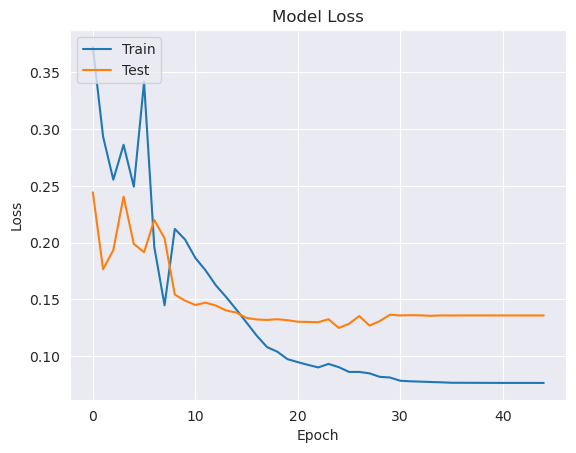

In [37]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

In [30]:
def generate_cross_validation_sets(df, K, iteration):
    train_df = pd.DataFrame(columns=["DAC","Frequency Error","Phase Error","Temperature"])
    val_df = pd.DataFrame(columns=["DAC","Frequency Error","Phase Error","Temperature"])
    test_df = pd.DataFrame(columns=["DAC","Frequency Error","Phase Error","Temperature"])

    for i in range(0,int(N_STAGES/K)):
        if i==iteration:
            test_df = test_df.append(df[K*i*STAGES_LENGTH:(K*i+K)*STAGES_LENGTH], ignore_index=True)
        elif i == (iteration+1)%N_STAGES or i == (iteration+2)%N_STAGES or i == (iteration+3)%N_STAGES:
            val_df = val_df.append(df[K*i*STAGES_LENGTH:(K*i+K)*STAGES_LENGTH], ignore_index=True)
        else:
            train_df = train_df.append(df[K*i*STAGES_LENGTH:(K*i+K)*STAGES_LENGTH], ignore_index=True)

    return train_df, val_df, test_df

In [31]:
def cross_validation_train_model(X_train, y_train, X_val, y_val, steps, deep_layers, lstm_units, lr, bs, epochs):
    model = Sequential()
    
    for i in range(deep_layers):
        model.add(LSTM(lstm_units, return_sequences=True))
    
    model.add(LSTM(lstm_units, return_sequences=False))
    model.add(Dense(steps, activation="linear", kernel_initializer=tf.initializers.zeros()))
    

    early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss',
                                                    patience=20,
                                                    mode='min')
    
    rlrop = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5)
    
    model.compile(loss=tf.keras.losses.MeanSquaredError(),
                optimizer=tf.keras.optimizers.Adam(learning_rate=lr),
                metrics=[tf.keras.metrics.MeanAbsoluteError()])
    
    history = model.fit(X_train,y_train, epochs=epochs, batch_size=bs, validation_data=(X_val, y_val),
                      callbacks=[early_stopping, rlrop],verbose=0)
    return history, model

In [32]:
def cross_validation_tuning(results_df, df, K, pred_steps, layers, lstm_units, lr, bs, epochs):
    for deep in layers:
        for units in lstm_units:
            for learning in lr:
                for batch in bs:
                    for steps in pred_steps:
                        mae_vector, rmse_vector = np.array([]), np.array([])
                        for fold in range(0, int(N_STAGES/K)):
                            train_df, val_df, test_df = generate_cross_validation_sets(df, K, fold)
                            train_df, val_df, test_df, train_mean, train_std = normalize_datasets(train_df, val_df, test_df)
                            X_train, y_train = generate_window_per_stage(train_df, "DAC",STAGES_LENGTH-steps,steps)
                            X_val, y_val = generate_window_per_stage(val_df, "DAC",STAGES_LENGTH-steps,steps)
                            X_test, y_test = generate_window_per_stage(test_df, "DAC",STAGES_LENGTH-steps,steps)
                            history, model = cross_validation_train_model(X_train, y_train, X_val, y_val, 
                                                        deep_layers=deep, steps=steps, lstm_units=units,
                                                        lr=learning, bs=batch, epochs=epochs)
                            results = model.predict(X_test, verbose=0).reshape(y_test.shape[0],y_test.shape[1],1)
                            mae, rmse = get_metrics(y_test.flatten(), results.flatten(), False)
                            mae_vector = np.append(mae_vector,mae)
                            rmse_vector = np.append(rmse_vector,rmse)
                            #out = "\n".join([
                            #    f"Deep={deep}, Steps={steps}, LSTM_units={units}, Learning_Rate={learning}, Batch_Size={batch}, Max_Epochs={epochs}",
                            #    f"MAE:{mae}",
                            #    f"RMSE:{rmse}",
                            #    "----------------------------------------"
                            #])
                            #print(out)
                            #reset_weights(model)
                        aux = pd.Series([mae_vector.mean(),rmse_vector.mean(),deep,steps,units,learning,batch,epochs,K],index=results_df.columns)
                        results_df = results_df.append(aux,ignore_index=True)

    return results_df

In [10]:
#cross_val_df = pd.DataFrame(columns=["mae","rmse","deep_layers","steps_predicted","lstm_units","learning_rate","batch_size","max_epochs","K"])
cross_val_df = pd.read_csv("datasets/cross_val_prediction_results.csv")

In [22]:
cross_val_df.to_csv("datasets/cross_val_prediction_results.csv", index=False)

In [37]:
cross_val_df

,mae,rmse,deep_layers,steps_predicted,lstm_units,learning_rate,batch_size,max_epochs,K
0,0.457445,0.542932,1.0,50.0,120.0,0.008,1.0,300.0,1.0
1,0.398021,0.480313,0.0,50.0,40.0,0.008,1.0,300.0,1.0
2,0.486486,0.590665,0.0,100.0,40.0,0.008,1.0,300.0,1.0
3,0.403288,0.491369,0.0,50.0,40.0,0.010,1.0,300.0,1.0
4,0.488378,0.587601,0.0,100.0,40.0,0.010,1.0,300.0,1.0
5,0.416177,0.502834,0.0,50.0,60.0,0.008,1.0,300.0,1.0
6,0.478633,0.579034,0.0,100.0,60.0,0.008,1.0,300.0,1.0
7,0.425428,0.513739,0.0,50.0,60.0,0.010,1.0,300.0,1.0
8,0.479080,0.581381,0.0,100.0,60.0,0.010,1.0,300.0,1.0
9,0.392397,0.477213,0.0,50.0,120.0,0.008,1.0,300.0,1.0


In [36]:
cross_val_df = cross_validation_tuning(cross_val_df, df, 1, [50,100], [0,1], [40,60,120], [0.008,0.01], [1], 300)

/tmp/ipykernel_24836/3153612208.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  test_df = test_df.append(df[K*i*STAGES_LENGTH:(K*i+K)*STAGES_LENGTH], ignore_index=True)
/tmp/ipykernel_24836/3153612208.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append(df[K*i*STAGES_LENGTH:(K*i+K)*STAGES_LENGTH], ignore_index=True)
/tmp/ipykernel_24836/3153612208.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append(df[K*i*STAGES_LENGTH:(K*i+K)*STAGES_LENGTH], ignore_index=True)
/tmp/ipykernel_24836/3153612208.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append(df[K*i*STAGES_LENGT

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 15:29:55.906632: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:29:55.910203: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:29:55.913891: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 15:30:16.489539: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:30:16.492947: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:30:16.495788: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 15:30:37.178267: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:30:37.182260: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:30:37.186056: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 15:30:58.626990: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:30:58.630206: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:30:58.633555: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 15:31:19.867806: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:31:19.872847: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:31:19.875749: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 15:31:38.246997: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:31:38.251097: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:31:38.254245: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 15:32:24.117247: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:32:24.120204: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:32:24.124350: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 15:32:54.234406: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:32:54.243090: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:32:54.249142: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 15:33:14.562248: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:33:14.567907: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:33:14.571031: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 15:33:35.091549: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:33:35.094460: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:33:35.096150: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 15:33:53.390316: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:33:53.393162: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:33:53.395053: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 15:34:19.662436: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:34:19.665798: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:34:19.667932: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 15:34:39.228058: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:34:39.231607: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:34:39.233686: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 15:34:58.705388: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:34:58.709077: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:34:58.712143: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 15:35:18.010416: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:35:18.013839: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:35:18.016055: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 15:35:40.446407: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:35:40.450581: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:35:40.454035: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 15:36:03.527312: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:36:03.531503: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:36:03.534462: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 15:36:46.381334: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:36:46.385213: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:36:46.387639: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 15:37:09.545284: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:37:09.550176: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:37:09.553906: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 15:37:32.749597: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:37:32.754128: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:37:32.757110: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 15:37:55.441859: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:37:55.445341: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:37:55.447549: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 15:38:18.034199: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:38:18.040066: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:38:18.042635: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 15:38:38.908789: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:38:38.912493: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:38:38.915535: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 15:38:53.942987: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:38:53.946949: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:38:53.951226: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 15:39:07.924957: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:39:07.929558: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:39:07.932368: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 15:39:26.069317: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:39:26.072774: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:39:26.077269: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 15:39:42.198882: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:39:42.202814: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:39:42.207001: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 15:39:59.231866: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:39:59.236012: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:39:59.239365: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 15:40:14.198243: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:40:14.201802: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:40:14.204767: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 15:40:31.001916: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:40:31.013315: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:40:31.033153: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 15:40:48.430608: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:40:48.434083: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:40:48.436677: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 15:41:02.700644: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:41:02.704376: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:41:02.709080: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 15:41:19.383080: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:41:19.387877: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:41:19.391216: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 15:41:38.355685: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:41:38.359277: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:41:38.362188: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 15:41:55.124036: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:41:55.127068: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:41:55.129968: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 15:42:10.885593: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:42:10.889225: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:42:10.891838: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 15:42:26.499797: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:42:26.503186: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:42:26.507711: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 15:42:42.019076: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:42:42.023808: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:42:42.026828: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 15:43:01.150014: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:43:01.154908: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:43:01.158257: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 15:43:18.388577: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:43:18.392455: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:43:18.395278: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 15:43:35.643329: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:43:35.647177: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:43:35.650701: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 15:43:55.478139: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:43:55.484102: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:43:55.487160: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 15:44:13.941846: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:44:13.949844: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:44:13.954025: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 15:44:34.786746: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:44:34.789811: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:44:34.791626: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 15:44:52.921133: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:44:52.924516: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:44:52.929075: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 15:45:19.617015: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:45:19.621909: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:45:19.626310: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 15:45:47.796374: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:45:47.800030: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:45:47.802540: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 15:46:14.166774: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:46:14.171402: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:46:14.173828: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 15:46:41.371628: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:46:41.377534: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:46:41.380878: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 15:47:14.938622: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:47:14.942851: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:47:14.948168: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 15:47:45.075033: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:47:45.078679: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:47:45.080882: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 15:48:14.520241: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:48:14.531142: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:48:14.539398: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 15:48:43.657093: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:48:43.660455: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:48:43.662570: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 15:49:08.641308: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:49:08.645971: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:49:08.648492: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 15:49:34.675094: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:49:34.679656: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:49:34.683361: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 15:49:58.771178: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:49:58.773441: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:49:58.778331: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 15:50:25.898952: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:50:25.903325: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:50:25.906474: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 15:50:51.010004: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:50:51.014092: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:50:51.016565: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 15:51:19.082753: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:51:19.087865: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:51:19.092767: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 15:51:44.491199: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:51:44.496165: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:51:44.501382: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 15:52:10.815568: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:52:10.824462: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:52:10.828575: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 15:52:36.405088: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:52:36.411066: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:52:36.414711: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 15:53:01.137278: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:53:01.141286: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:53:01.145551: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 15:53:33.362046: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:53:33.365564: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:53:33.372170: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 15:54:10.147377: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:54:10.152245: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:54:10.157401: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 15:54:39.639340: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:54:39.646803: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:54:39.649852: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 15:55:05.155044: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:55:05.160599: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:55:05.165335: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 15:55:22.803721: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:55:22.810946: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:55:22.816286: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 15:55:42.018209: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:55:42.021723: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:55:42.026282: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 15:56:00.296412: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:56:00.299788: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:56:00.303797: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 15:56:22.041335: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:56:22.045476: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:56:22.048374: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 15:56:42.596191: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:56:42.599009: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:56:42.601137: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 15:57:01.628978: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:57:01.633653: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:57:01.640749: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 15:57:21.697967: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:57:21.702856: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:57:21.708000: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 15:57:42.567788: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:57:42.573784: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:57:42.577608: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 15:58:00.604108: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:58:00.609798: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:58:00.612885: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 15:58:22.430124: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:58:22.432589: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:58:22.436545: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 15:58:42.790365: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:58:42.794452: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:58:42.797726: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 15:59:03.117798: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:59:03.124611: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:59:03.128894: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 15:59:20.796102: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:59:20.800947: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:59:20.804462: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 15:59:38.444804: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:59:38.452277: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:59:38.457107: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 15:59:56.894692: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 15:59:56.900897: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 15:59:56.904468: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 16:00:18.507604: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:00:18.510759: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:00:18.517562: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 16:00:38.696754: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:00:38.704362: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:00:38.708744: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 16:00:57.826750: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:00:57.834354: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:00:57.838209: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 16:01:25.599374: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:01:25.607901: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:01:25.611824: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 16:01:44.704022: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:01:44.708939: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:01:44.711683: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 16:02:04.763306: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:02:04.771282: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:02:04.776495: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 16:02:25.553628: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:02:25.557631: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:02:25.561911: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 16:02:51.666550: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:02:51.671365: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:02:51.675680: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 16:03:20.246807: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:03:20.251020: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:03:20.254504: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 16:03:48.961672: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:03:48.964711: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:03:48.970589: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 16:04:16.114646: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:04:16.119302: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:04:16.124338: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 16:04:43.639665: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:04:43.643220: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:04:43.648829: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 16:05:15.372698: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:05:15.379004: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:05:15.382974: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 16:05:44.018326: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:05:44.024403: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:05:44.030355: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 16:06:08.478487: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:06:08.485188: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:06:08.489420: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 16:06:36.181624: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:06:36.186304: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:06:36.191170: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 16:07:01.019662: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:07:01.025079: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:07:01.028767: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 16:07:48.456251: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:07:48.458974: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:07:48.464741: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 16:08:12.989639: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:08:12.993198: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:08:12.995370: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 16:08:41.231473: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:08:41.234988: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:08:41.242967: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 16:09:09.356362: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:09:09.360350: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:09:09.364933: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 16:09:35.920540: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:09:35.924463: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:09:35.926854: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 16:10:06.746823: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:10:06.750365: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:10:06.754000: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 16:10:35.574920: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:10:35.577919: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:10:35.584486: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 16:11:03.023518: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:11:03.030902: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:11:03.038214: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 16:11:34.868311: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:11:34.873059: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:11:34.875399: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 16:12:01.989738: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:12:01.995252: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:12:01.997996: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 16:12:32.911169: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:12:32.917377: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:12:32.919807: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 16:12:59.874617: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:12:59.877260: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:12:59.881979: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 16:13:18.877504: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:13:18.883028: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:13:18.885911: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 16:13:40.525543: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:13:40.529346: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:13:40.534242: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 16:14:01.928194: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:14:01.934692: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:14:01.939232: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 16:14:25.605971: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:14:25.608899: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:14:25.613734: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 16:14:44.540579: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:14:44.543330: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:14:44.545177: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 16:15:05.162726: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:15:05.168447: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:15:05.171761: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 16:15:24.048717: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:15:24.053382: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:15:24.057865: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 16:15:41.666562: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:15:41.670959: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:15:41.673480: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 16:16:02.724318: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:16:02.728616: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:16:02.733558: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 16:16:22.586393: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:16:22.590088: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:16:22.592498: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 16:16:43.087071: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:16:43.090388: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:16:43.095752: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 16:17:02.855805: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:17:02.859286: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:17:02.864149: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 16:17:22.360532: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:17:22.367331: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:17:22.370755: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 16:17:39.150344: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:17:39.157089: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:17:39.161088: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 16:18:00.502749: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:18:00.506271: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:18:00.511982: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 16:18:22.184843: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:18:22.187495: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:18:22.189857: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 16:18:45.720279: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:18:45.723339: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:18:45.726394: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 16:19:03.618084: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:19:03.622604: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:19:03.629052: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 16:19:22.686624: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:19:22.692110: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:19:22.697295: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 16:19:46.005837: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:19:46.012888: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:19:46.017925: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 16:20:08.746526: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:20:08.756147: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:20:08.768046: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 16:20:27.136332: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:20:27.139048: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:20:27.142523: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 16:20:54.549886: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:20:54.554351: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:20:54.557186: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 16:21:20.247786: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:21:20.252914: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:21:20.259239: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 16:21:44.635093: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:21:44.641043: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:21:44.646801: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 16:22:09.427324: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:22:09.431386: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:22:09.434675: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 16:22:43.800104: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:22:43.805606: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:22:43.811531: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 16:23:14.526923: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:23:14.532750: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:23:14.535984: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 16:23:41.332262: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:23:41.337508: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:23:41.340625: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 16:24:05.007717: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:24:05.013256: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:24:05.015882: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 16:24:30.998708: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:24:31.001375: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:24:31.003423: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 16:24:56.706668: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:24:56.710882: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:24:56.716472: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 16:25:22.548383: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:25:22.553396: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:25:22.556826: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 16:25:50.069109: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:25:50.075289: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:25:50.079085: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 16:26:13.323817: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:26:13.329043: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:26:13.332757: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 16:26:36.618305: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:26:36.621209: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:26:36.623423: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 16:27:01.008409: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:27:01.013612: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:27:01.016395: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 16:27:24.833764: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:27:24.837488: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:27:24.840541: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 16:27:53.316511: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:27:53.320516: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:27:53.324872: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 16:28:22.118607: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:28:22.122896: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:28:22.126653: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 16:28:47.511642: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:28:47.517290: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:28:47.520899: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 16:29:09.887670: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:29:09.892732: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:29:09.895219: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 16:29:34.264570: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:29:34.267199: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:29:34.273469: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 16:29:57.852829: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:29:57.859829: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:29:57.863992: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 16:30:15.843324: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:30:15.847285: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:30:15.849522: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 16:30:38.698457: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:30:38.702574: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:30:38.708100: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 16:30:58.700276: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:30:58.704564: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:30:58.708674: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 16:31:17.336039: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:31:17.341163: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:31:17.344168: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 16:31:35.154668: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:31:35.158369: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:31:35.162200: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 16:31:53.061006: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:31:53.065856: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:31:53.069490: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 16:32:12.424208: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:32:12.426775: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:32:12.428858: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 16:32:39.395538: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:32:39.398696: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:32:39.402926: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 16:33:01.750069: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:33:01.755066: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:33:01.760845: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 16:33:21.425595: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:33:21.429453: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:33:21.432073: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 16:33:40.533604: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:33:40.538864: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:33:40.542723: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 16:33:59.128205: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:33:59.131689: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:33:59.137678: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 16:34:18.695342: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:34:18.700472: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:34:18.706249: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 16:34:38.394622: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:34:38.399038: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:34:38.403541: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 16:34:57.655780: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:34:57.658771: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:34:57.660887: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 16:35:15.574780: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:35:15.580592: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:35:15.584445: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 16:35:33.688099: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:35:33.690530: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:35:33.694380: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 16:35:53.969731: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:35:53.972758: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:35:53.975994: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 16:36:11.715191: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:36:11.719703: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:36:11.724295: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 16:36:31.239673: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:36:31.244355: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:36:31.248322: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 16:36:52.662859: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:36:52.667302: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:36:52.669403: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 16:37:10.460307: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:37:10.465657: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:37:10.468404: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 16:37:39.307362: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:37:39.310862: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:37:39.315920: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 16:38:09.634551: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:38:09.641885: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:38:09.646858: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 16:38:36.939148: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:38:36.944824: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:38:36.950648: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 16:39:06.063041: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:39:06.069217: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:39:06.074678: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 16:39:41.841605: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:39:41.846950: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:39:41.850643: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 16:40:15.318046: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:40:15.322980: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:40:15.329062: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 16:40:47.092114: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:40:47.095631: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:40:47.101279: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 16:41:15.106093: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:41:15.109748: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:41:15.112353: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 16:41:47.299725: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:41:47.303554: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:41:47.307479: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 16:42:20.441315: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:42:20.447770: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:42:20.450526: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 16:42:57.209518: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:42:57.213291: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:42:57.215651: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 16:43:27.994319: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:43:28.001534: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:43:28.004510: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 16:43:59.391488: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:43:59.396582: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:43:59.398533: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 16:44:30.146833: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:44:30.151115: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:44:30.153352: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 16:44:58.838909: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:44:58.843890: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:44:58.846211: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 16:45:40.880902: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:45:40.884895: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:45:40.888788: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 16:46:21.295864: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:46:21.302444: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:46:21.305501: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 16:46:55.590296: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:46:55.593340: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:46:55.597622: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 16:47:26.615570: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:47:26.618764: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:47:26.625036: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 16:47:53.201376: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:47:53.204604: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:47:53.206761: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 16:48:25.578276: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:48:25.581816: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:48:25.587431: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 16:48:57.397250: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:48:57.402960: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:48:57.405673: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 16:49:21.217140: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:49:21.223012: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:49:21.225543: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 16:49:44.993453: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:49:44.996353: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:49:45.000938: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 16:50:06.621696: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:50:06.625196: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:50:06.629115: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 16:50:33.415559: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:50:33.419612: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:50:33.423725: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 16:50:53.849983: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:50:53.852476: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:50:53.858313: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 16:51:15.519491: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:51:15.524722: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:51:15.528412: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 16:51:37.781329: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:51:37.785733: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:51:37.788329: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 16:51:59.835551: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:51:59.838310: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:51:59.842364: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 16:52:20.957392: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:52:20.965501: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:52:20.969492: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 16:52:43.234814: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:52:43.238181: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:52:43.240033: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 16:53:03.874778: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:53:03.880777: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:53:03.884065: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 16:53:27.788802: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:53:27.792198: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:53:27.794988: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 16:53:48.333712: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:53:48.337413: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:53:48.341230: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 16:54:13.775332: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:54:13.780377: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:54:13.785365: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 16:54:35.286342: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:54:35.290667: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:54:35.294369: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 16:54:56.410211: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:54:56.413439: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:54:56.415809: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 16:55:20.048228: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:55:20.054417: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:55:20.059568: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 16:55:39.507544: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:55:39.511077: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:55:39.514443: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 16:56:05.661090: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:56:05.666802: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:56:05.669521: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 16:56:25.695816: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:56:25.701087: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:56:25.703551: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 16:56:49.787022: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:56:49.790552: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:56:49.796033: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 16:57:09.394455: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:57:09.400112: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:57:09.403412: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 16:57:37.333584: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:57:37.340245: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:57:37.342918: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 16:58:08.442262: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:58:08.448715: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:58:08.451176: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 16:58:35.928090: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:58:35.935560: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:58:35.939322: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 16:59:09.542269: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:59:09.547136: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:59:09.550718: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 16:59:42.290907: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 16:59:42.294375: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 16:59:42.296980: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 17:00:10.953777: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:00:10.958766: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:00:10.961957: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 17:00:44.271512: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:00:44.274909: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:00:44.278536: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 17:01:12.838119: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:01:12.843970: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:01:12.846998: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 17:01:45.711400: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:01:45.714195: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:01:45.719802: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 17:02:23.255016: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:02:23.258438: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:02:23.260466: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 17:02:59.127682: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:02:59.133858: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:02:59.136440: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 17:03:32.531499: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:03:32.535772: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:03:32.540718: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 17:04:02.322074: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:04:02.325232: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:04:02.330800: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 17:04:35.936442: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:04:35.944182: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:04:35.948092: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 17:05:04.226149: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:05:04.232166: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:05:04.236596: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 17:05:38.131412: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:05:38.134696: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:05:38.139066: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 17:06:10.258375: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:06:10.260951: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:06:10.265811: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 17:06:41.202089: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:06:41.208176: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:06:41.213851: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 17:07:12.152672: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:07:12.156022: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:07:12.160034: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 17:07:46.496247: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:07:46.501457: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:07:46.503620: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 17:08:20.215709: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:08:20.221972: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:08:20.227736: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 17:08:59.796386: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:08:59.800227: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:08:59.805814: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 17:09:20.330326: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:09:20.336022: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:09:20.340490: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 17:09:41.243825: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:09:41.246598: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:09:41.248621: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 17:10:02.678523: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:10:02.682616: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:10:02.688200: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 17:10:25.429737: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:10:25.432555: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:10:25.434897: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 17:10:44.712479: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:10:44.715305: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:10:44.717840: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 17:11:07.593005: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:11:07.598178: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:11:07.601255: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 17:11:27.958129: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:11:27.963879: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:11:27.966359: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 17:11:52.986486: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:11:52.989617: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:11:52.993803: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 17:12:12.314759: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:12:12.318910: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:12:12.322479: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 17:12:33.608421: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:12:33.613734: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:12:33.616152: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 17:12:59.876833: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:12:59.881723: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:12:59.884898: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 17:13:25.820617: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:13:25.826752: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:13:25.829483: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 17:13:48.035661: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:13:48.042883: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:13:48.045655: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 17:14:08.072051: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:14:08.077417: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:14:08.080671: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 17:14:30.412545: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:14:30.415047: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:14:30.417161: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 17:14:49.395833: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:14:49.398353: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:14:49.402647: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 17:15:12.741675: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:15:12.747027: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:15:12.749180: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 17:15:34.865944: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:15:34.868768: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:15:34.871046: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 17:16:01.013276: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:16:01.016177: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:16:01.021327: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 17:16:22.820011: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:16:22.824992: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:16:22.829889: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 17:16:47.195827: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:16:47.200841: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:16:47.203646: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 17:17:08.175367: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:17:08.179454: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:17:08.184099: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 17:18:02.196213: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:18:02.199282: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:18:02.201219: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 17:18:49.639687: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:18:49.643414: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:18:49.647716: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 17:20:22.448156: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:20:22.451134: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:20:22.455238: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 17:21:13.823521: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:21:13.826502: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:21:13.830894: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 17:22:10.423136: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:22:10.431148: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:22:10.436805: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 17:23:11.120068: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:23:11.124111: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:23:11.128632: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 17:24:05.054544: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:24:05.057784: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:24:05.061572: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 17:24:48.909647: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:24:48.913779: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:24:48.917108: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 17:25:38.557484: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:25:38.562927: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:25:38.565800: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 17:26:27.763123: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:26:27.767262: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:26:27.770995: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 17:27:09.153579: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:27:09.157990: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:27:09.162673: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 17:27:55.316724: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:27:55.332460: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:27:55.336351: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 17:28:42.636830: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:28:42.639489: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:28:42.642680: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 17:29:28.226740: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:29:28.233928: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:29:28.236983: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 17:30:09.477131: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:30:09.483371: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:30:09.486603: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 17:30:59.852417: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:30:59.856746: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:30:59.859799: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 17:31:46.086524: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:31:46.090884: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:31:46.095172: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 17:32:47.099512: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:32:47.102923: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:32:47.106346: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 17:33:34.054915: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:33:34.058293: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:33:34.061244: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 17:34:21.775760: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:34:21.779666: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:34:21.781595: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 17:35:08.283578: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:35:08.286599: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:35:08.292273: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 17:35:55.294952: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:35:55.299188: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:35:55.302098: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 17:36:26.074089: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:36:26.079589: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:36:26.083058: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 17:37:00.213403: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:37:00.218812: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:37:00.222771: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 17:37:32.255050: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:37:32.259535: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:37:32.261546: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 17:38:00.954975: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:38:00.957646: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:38:00.960212: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 17:38:30.295497: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:38:30.298801: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:38:30.303160: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 17:38:59.922351: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:38:59.926266: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:38:59.929820: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 17:39:25.561417: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:39:25.565835: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:39:25.568770: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 17:39:52.695842: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:39:52.701040: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:39:52.706971: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 17:40:23.165261: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:40:23.168109: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:40:23.170713: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 17:40:49.874423: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:40:49.877608: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:40:49.879912: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 17:41:18.879793: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:41:18.882053: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:41:18.883788: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 17:41:45.612199: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:41:45.616401: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:41:45.619747: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 17:42:20.424336: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:42:20.429080: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:42:20.431176: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 17:42:46.753026: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:42:46.755535: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:42:46.758410: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 17:43:14.275630: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:43:14.278214: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:43:14.281404: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 17:43:47.764432: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:43:47.770635: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:43:47.774807: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 17:44:24.935295: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:44:24.940719: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:44:24.945538: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 17:44:51.595490: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:44:51.599805: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:44:51.603508: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 17:45:23.902601: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:45:23.907265: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:45:23.910810: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 17:45:56.785836: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:45:56.789466: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:45:56.791758: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 17:46:28.091829: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:46:28.096042: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:46:28.098758: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 17:46:52.333035: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:46:52.336127: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:46:52.338291: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 17:47:29.724959: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:47:29.728794: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:47:29.731915: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 17:48:12.494652: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:48:12.498653: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:48:12.501212: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 17:48:56.813167: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:48:56.817807: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:48:56.820154: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 17:49:42.105183: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:49:42.107963: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:49:42.109765: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 17:50:22.891879: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:50:22.895431: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:50:22.898577: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 17:51:11.780701: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:51:11.785161: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:51:11.788481: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 17:52:00.762985: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:52:00.766697: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:52:00.769182: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 17:52:43.857713: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:52:43.863429: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:52:43.866641: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 17:53:28.727797: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:53:28.733926: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:53:28.737976: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 17:54:14.289349: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:54:14.292734: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:54:14.295032: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 17:54:51.793509: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:54:51.797823: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:54:51.801457: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 17:55:32.349329: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:55:32.352980: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:55:32.355865: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 17:56:13.110082: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:56:13.112665: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:56:13.115506: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 17:57:03.745400: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:57:03.748438: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:57:03.750709: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 17:57:43.048555: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:57:43.053248: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:57:43.057113: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 17:58:30.180972: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:58:30.183993: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:58:30.186141: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 17:59:09.026216: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 17:59:09.029924: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 17:59:09.032248: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 18:00:10.782956: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:00:10.785267: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:00:10.789660: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 18:00:50.962059: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:00:50.964699: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:00:50.966594: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 18:01:33.739021: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:01:33.743078: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:01:33.745834: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 18:02:16.578922: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:02:16.581390: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:02:16.583857: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 18:03:00.010212: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:03:00.015045: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:03:00.019058: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 18:03:30.624368: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:03:30.628249: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:03:30.632405: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 18:04:04.316267: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:04:04.320299: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:04:04.322843: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 18:04:32.689777: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:04:32.693036: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:04:32.695275: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 18:05:00.620046: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:05:00.624156: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:05:00.627483: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 18:05:32.110118: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:05:32.113866: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:05:32.120804: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 18:05:58.980874: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:05:58.983763: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:05:58.987401: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 18:06:23.904071: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:06:23.908253: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:06:23.911964: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 18:06:57.344157: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:06:57.349240: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:06:57.355055: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 18:07:26.263348: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:07:26.267799: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:07:26.271330: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 18:08:02.342398: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:08:02.345703: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:08:02.347895: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 18:08:32.393256: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:08:32.397702: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:08:32.400507: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 18:09:15.958225: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:09:15.963385: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:09:15.968944: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 18:09:44.074244: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:09:44.077357: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:09:44.080918: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 18:10:14.139190: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:10:14.143930: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:10:14.148026: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 18:10:44.521625: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:10:44.525683: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:10:44.528572: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 18:11:16.769598: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:11:16.773328: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:11:16.776644: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 18:11:51.119841: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:11:51.124507: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:11:51.127541: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 18:12:19.356597: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:12:19.359357: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:12:19.365062: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 18:12:47.310107: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:12:47.312624: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:12:47.314706: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 18:13:19.621670: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:13:19.624023: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:13:19.627333: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 18:13:49.022756: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:13:49.026501: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:13:49.030055: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 18:14:15.265072: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:14:15.267961: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:14:15.269937: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 18:14:58.280793: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:14:58.284152: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:14:58.286606: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 18:15:54.044859: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:15:54.048287: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:15:54.050359: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 18:16:37.364434: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:16:37.366575: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:16:37.368382: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 18:17:25.572261: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:17:25.576600: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:17:25.580958: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 18:18:28.607054: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:18:28.613386: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:18:28.617147: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 18:19:10.886912: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:19:10.889880: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:19:10.891746: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 18:20:21.696489: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:20:21.699113: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:20:21.703405: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 18:21:02.648949: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:21:02.653203: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:21:02.656718: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 18:21:47.512239: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:21:47.515097: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:21:47.517802: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 18:22:29.065627: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:22:29.069572: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:22:29.075237: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 18:23:06.951387: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:23:06.958544: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:23:06.961308: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 18:23:47.991657: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:23:47.995301: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:23:47.998119: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 18:24:28.506030: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:24:28.510642: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:24:28.513866: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 18:25:12.722834: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:25:12.728170: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:25:12.731090: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 18:25:46.083123: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:25:46.086040: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:25:46.088231: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 18:26:15.100656: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:26:15.102918: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:26:15.104894: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 18:26:39.883567: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:26:39.885584: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:26:39.887132: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 18:27:07.640333: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:27:07.642264: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:27:07.643755: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 18:27:44.508625: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:27:44.513939: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:27:44.517652: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 18:29:11.892286: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:29:11.894549: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:29:11.896071: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 18:29:40.005472: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:29:40.008937: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:29:40.011699: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 18:30:27.457235: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:30:27.459465: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:30:27.461366: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 18:30:47.482636: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:30:47.485121: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:30:47.487364: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 18:31:10.220941: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:31:10.222972: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:31:10.224530: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 18:31:40.035500: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:31:40.040383: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:31:40.044263: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 18:32:05.282262: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:32:05.284316: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:32:05.285904: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 18:32:34.710850: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:32:34.713427: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:32:34.715010: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 18:32:53.503062: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:32:53.505205: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:32:53.507970: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 18:33:12.146507: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:33:12.148740: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:33:12.150849: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 18:33:35.552597: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:33:35.556222: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:33:35.560770: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 18:34:04.326707: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:34:04.329946: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:34:04.332391: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 18:34:29.875977: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:34:29.878405: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:34:29.880686: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 18:34:54.202299: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:34:54.205130: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:34:54.207530: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 18:35:19.072057: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:35:19.074014: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:35:19.075628: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 18:35:37.434229: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:35:37.437258: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:35:37.439615: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 18:35:56.345950: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:35:56.348847: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:35:56.350796: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 18:36:16.595190: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:36:16.597965: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:36:16.599704: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 18:36:39.784550: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:36:39.786813: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:36:39.788515: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 18:36:59.446311: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:36:59.448544: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:36:59.450373: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 18:37:16.563757: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:37:16.566535: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:37:16.568717: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 18:37:34.366368: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:37:34.369217: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:37:34.371519: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 18:37:55.416842: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:37:55.419089: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:37:55.420990: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 18:38:13.849203: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:38:13.851641: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:38:13.853595: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 18:38:34.394986: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:38:34.397053: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:38:34.398697: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 18:39:02.667758: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:39:02.670339: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:39:02.672589: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 18:39:41.388122: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:39:41.390050: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:39:41.391474: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 18:40:11.182848: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:40:11.185174: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:40:11.186950: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 18:40:47.381355: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:40:47.383306: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:40:47.384798: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 18:41:43.115762: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:41:43.117657: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:41:43.119222: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 18:42:29.685530: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:42:29.687385: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:42:29.688862: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 18:43:15.024568: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:43:15.027215: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:43:15.029642: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 18:43:49.647015: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:43:49.650492: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:43:49.652808: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 18:44:21.088136: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:44:21.093049: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:44:21.095121: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 18:44:53.606555: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:44:53.608815: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:44:53.610777: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 18:45:32.275370: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:45:32.277321: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:45:32.279042: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 18:46:06.621409: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:46:06.623393: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:46:06.624922: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 18:46:42.605309: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:46:42.607253: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:46:42.609062: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 18:47:08.243423: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:47:08.245783: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:47:08.247264: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 18:47:33.733277: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:47:33.735093: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:47:33.736693: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 18:48:07.334151: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:48:07.336415: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:48:07.338029: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 18:48:38.497891: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:48:38.501392: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:48:38.504320: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 18:49:19.031327: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:49:19.035552: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:49:19.038713: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 18:49:50.770347: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:49:50.772656: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:49:50.774634: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 18:50:31.272022: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:50:31.274015: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:50:31.275547: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 18:51:02.589495: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:51:02.591383: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:51:02.592843: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 18:51:41.336762: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:51:41.338643: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:51:41.340043: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 18:51:59.692680: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:51:59.694693: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:51:59.696353: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 18:52:28.502646: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:52:28.506634: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:52:28.508590: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 18:52:47.949088: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:52:47.951515: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:52:47.953505: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 18:53:10.035090: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:53:10.037733: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:53:10.039664: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 18:53:32.313726: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:53:32.315901: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:53:32.317517: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 18:53:52.109871: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:53:52.112419: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:53:52.114076: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 18:54:12.349539: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:54:12.351488: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:54:12.353515: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 18:54:31.791389: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:54:31.793440: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:54:31.796512: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 18:54:55.147068: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:54:55.149081: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:54:55.150655: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 18:55:15.584119: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:55:15.587672: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:55:15.589477: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 18:55:39.302756: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:55:39.304886: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:55:39.306484: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 18:56:04.142638: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:56:04.144424: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:56:04.145823: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 18:56:32.647503: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:56:32.649723: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:56:32.651420: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 18:56:50.458895: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:56:50.460773: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:56:50.462246: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 18:57:09.335604: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:57:09.338078: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:57:09.340082: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 18:57:29.255838: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:57:29.258349: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:57:29.259907: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 18:57:50.754868: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:57:50.756839: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:57:50.758500: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 18:58:11.026011: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:58:11.030160: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:58:11.033129: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 18:58:33.318262: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:58:33.320144: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:58:33.322056: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 18:58:56.465061: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:58:56.468260: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:58:56.471719: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 18:59:23.194353: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:59:23.196571: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:59:23.198357: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 18:59:46.181299: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 18:59:46.184288: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 18:59:46.186131: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 19:00:22.240931: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:00:22.243084: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:00:22.244642: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 19:00:52.576863: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:00:52.579111: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:00:52.580871: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 19:01:29.167310: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:01:29.169429: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:01:29.170975: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 19:02:08.274985: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:02:08.276961: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:02:08.278449: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 19:02:50.952030: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:02:50.954186: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:02:50.955847: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 19:03:25.381756: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:03:25.383921: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:03:25.385973: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 19:04:06.749597: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:04:06.751748: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:04:06.753663: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 19:04:41.734670: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:04:41.736809: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:04:41.738591: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 19:05:30.136418: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:05:30.138409: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:05:30.140042: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 19:06:05.426710: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:06:05.428565: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:06:05.429979: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 19:06:36.609026: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:06:36.611272: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:06:36.612737: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 19:07:03.358136: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:07:03.360299: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:07:03.362171: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 19:07:34.654828: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:07:34.656640: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:07:34.658417: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 19:08:01.223691: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:08:01.225704: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:08:01.227353: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 19:08:34.877741: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:08:34.880807: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:08:34.882821: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 19:09:10.877175: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:09:10.879029: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:09:10.880451: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 19:09:38.881645: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:09:38.883691: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:09:38.885285: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 19:10:08.521980: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:10:08.524066: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:10:08.525593: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 19:10:39.306193: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:10:39.308295: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:10:39.309701: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 19:11:11.620325: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:11:11.622436: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:11:11.623795: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 19:11:49.193671: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:11:49.195503: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:11:49.197297: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 19:12:20.862534: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:12:20.864447: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:12:20.865934: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 19:12:40.624996: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:12:40.626921: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:12:40.628361: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 19:13:07.144525: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:13:07.146397: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:13:07.148136: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 19:13:25.519679: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:13:25.521790: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:13:25.523259: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 19:13:43.404118: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:13:43.406120: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:13:43.408032: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 19:14:03.947307: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:14:03.949149: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:14:03.950521: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 19:14:24.237440: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:14:24.239370: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:14:24.240931: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 19:14:42.593567: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:14:42.595378: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:14:42.596821: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 19:15:03.080820: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:15:03.082678: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:15:03.084281: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 19:15:23.150283: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:15:23.152291: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:15:23.154002: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 19:15:54.374159: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:15:54.376136: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:15:54.377676: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 19:16:17.913378: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:16:17.915251: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:16:17.916686: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 19:16:39.823416: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:16:39.825798: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:16:39.827601: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 19:17:04.678039: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:17:04.680210: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:17:04.681648: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 19:17:23.747380: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:17:23.749450: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:17:23.751012: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 19:17:43.755284: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:17:43.757260: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:17:43.758788: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 19:18:03.296124: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:18:03.298516: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:18:03.300335: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 19:18:28.568635: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:18:28.570626: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:18:28.572278: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 19:18:46.830710: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:18:46.832987: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:18:46.834634: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 19:19:09.198280: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:19:09.200149: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:19:09.201590: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 19:19:39.849645: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:19:39.853229: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:19:39.856975: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 19:20:04.404376: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:20:04.406526: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:20:04.408228: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 19:20:24.221369: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:20:24.224072: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:20:24.226195: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 19:20:57.604956: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:20:57.606796: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:20:57.608286: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 19:21:38.773853: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:21:38.776031: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:21:38.777501: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 19:22:09.395691: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:22:09.398003: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:22:09.400122: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 19:22:42.125119: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:22:42.127900: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:22:42.129889: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 19:23:13.788848: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:23:13.790758: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:23:13.792273: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 19:23:54.356539: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:23:54.358554: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:23:54.360146: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 19:24:23.050980: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:24:23.053191: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:24:23.054677: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 19:25:06.662694: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:25:06.664551: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:25:06.666078: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 19:25:41.145080: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:25:41.147150: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:25:41.148530: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 19:26:14.046928: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:26:14.048888: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:26:14.050701: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 19:27:13.665788: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:27:13.667847: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:27:13.669520: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 19:27:42.771913: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:27:42.773787: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:27:42.775828: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 19:28:27.944261: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:28:27.946449: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:28:27.947896: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 19:29:02.022362: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:29:02.024587: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:29:02.026092: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 19:29:44.890469: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:29:44.892546: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:29:44.894097: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 19:30:21.964550: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:30:21.966641: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:30:21.968267: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 19:30:49.041562: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:30:49.043589: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:30:49.045112: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 19:31:28.858156: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:31:28.860189: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:31:28.861880: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 19:32:06.820933: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:32:06.823033: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:32:06.824561: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 19:32:53.989963: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:32:53.991809: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:32:53.993363: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 100, 4)
Dimensiones de las ventanas de salida: (18, 50, 1)
Dimensiones de las ventanas de entrada: (3, 100, 4)
Dimensiones de las ventanas de salida: (3, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-01 19:33:21.321219: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:33:21.323451: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:33:21.324940: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 19:33:50.704747: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:33:50.706631: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:33:50.708204: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 19:34:11.708592: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:34:11.710402: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:34:11.711796: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 19:34:56.651465: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:34:56.653419: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:34:56.654899: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 19:35:25.705494: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:35:25.707641: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:35:25.709058: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 19:35:46.147861: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:35:46.149841: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:35:46.151265: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 19:36:05.388992: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:36:05.390902: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:36:05.392574: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 19:36:25.899514: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:36:25.901368: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:36:25.902966: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 19:36:49.102152: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:36:49.103973: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:36:49.105278: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 19:37:07.295636: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:37:07.297906: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:37:07.299454: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 19:37:29.067820: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:37:29.069697: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:37:29.071070: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 19:37:46.686800: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:37:46.688851: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:37:46.690430: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 19:38:24.474569: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:38:24.477054: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:38:24.478737: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 19:38:55.220873: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:38:55.223055: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:38:55.224702: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 19:39:28.433626: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:39:28.436195: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:39:28.438158: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 19:39:49.745905: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:39:49.748168: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:39:49.749944: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 19:40:14.011368: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:40:14.013333: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:40:14.014786: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 19:40:36.124374: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:40:36.126173: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:40:36.127693: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 19:41:01.276168: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:41:01.278098: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:41:01.279888: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 19:41:21.649800: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:41:21.652923: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:41:21.655738: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 19:41:46.005370: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:41:46.007267: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:41:46.009204: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 19:42:20.779046: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:42:20.785320: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:42:20.789518: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (18, 50, 4)
Dimensiones de las ventanas de salida: (18, 100, 1)
Dimensiones de las ventanas de entrada: (3, 50, 4)
Dimensiones de las ventanas de salida: (3, 100, 1)
Dimensiones de las ventanas de entrada: (1, 50, 4)
Dimensiones de las ventanas de salida: (1, 100, 1)


2023-06-01 19:42:56.505879: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-01 19:42:56.509544: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-01 19:42:56.512867: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus